In [1]:



# Importing necessary libs
import numpy as np
import h5py
import scipy
import matplotlib.pyplot as plt
from scipy.io.wavfile import read,write


h=h5py.File("hf_12.5_5MHz.h5","r")
z=np.copy(h["z"].value)
h.close()

# Task 5

## Task 5.1

In [2]:
# Samples long:

print(str(len(z))+' samples')

50000000 samples


The number of samples in the signal is 50000000

## Task 5.2

In [3]:
# Sampled with a 5MHz sample rate--> 1e6 samples/second
print(str(len(z)/(5*1e6))+' Seconds')

10.0 Seconds


The signal is 10 seconds long, here we took the total amount of samples and divided by the sample rate of the signal

## Task 5.3

The dependant variable is z(n), the real valued electric potential and the independant variable is time/ n, the sampling number

## Task 5.4

If the signal was real all we that would happen is a sign of the complex signal will change and we would have spectral component which are conjugate symmetric. If the the signal is complex we have have changes in signal when taking the conjugate of the fourier which will not be symmetric.

## Task 5.5

The practical benefit of using complex baseband signals for representing radio signals is that it uses less of the frequency spectrum since it does not have a complex conjugate

# Task 6

## Task 6.1

0.0002 Seconds


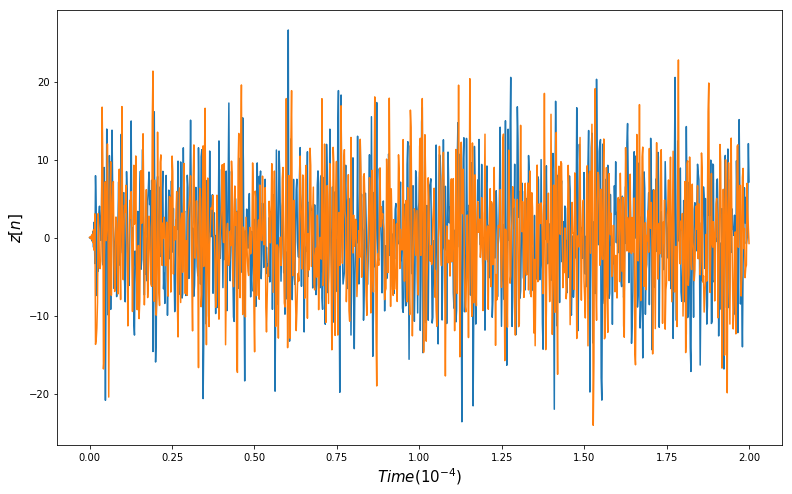

In [4]:

# Finding how long the time array should be
print(str(1000/(5*1e6))+' Seconds')

# Plotting real and imaginary part of the signal
time_vector = np.linspace(0,2,len(z[0:1000]))
plt.figure(figsize = ((13,8)))
plt.plot(time_vector,z[0:1000].real)
plt.plot(time_vector,z[0:1000].imag)
plt.xlabel('$Time (10^{-4})$',fontsize = '15')
plt.ylabel('$z[n]$',fontsize = '15')

plt.show()

# Task 6.2

Looks like the signal is full of noise

# Task 6.3

Since T = 1/f we have that $T_{s} = 1/f_{s} = 1/(5\cdot10^{6}Seconds) = 2\cdot10^{-7}Seconds$

# Task 6.4

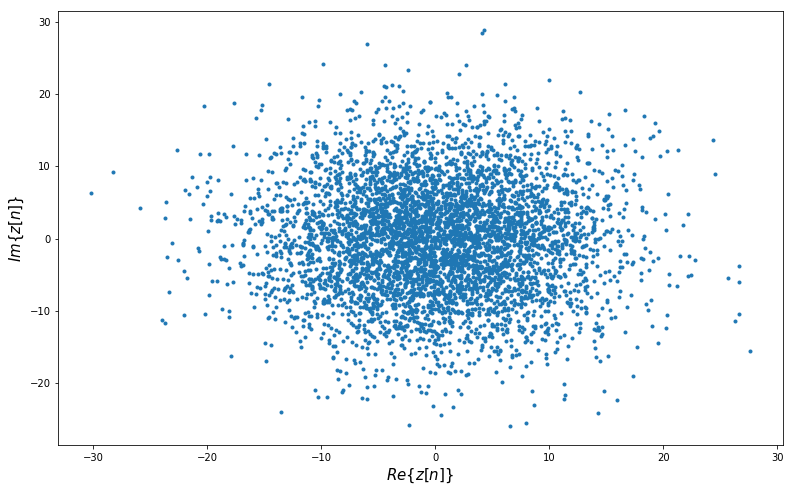

Magnitude of the mean of the signal is 0.08555
Approx = 0


In [5]:

# Plotting the complex plane (x = real, y = complex)
time_vector = np.linspace(0,1,len(z[0:5000]))
plt.figure(figsize = ((13,8)))
plt.plot(z[0:5000].real,z[0:5000].imag,'.')
plt.xlabel('$Re\{z[n]\}$',fontsize = '15')
plt.ylabel('$Im\{z[n]\}$',fontsize = '15')

plt.show()

# Finding mean of the signal
mean_real = np.mean(z[0:5000].real)
mean_imag = np.mean(z[0:5000].imag)
mean_len = np.sqrt((mean_real)**2 + (mean_imag)**2)

print('Magnitude of the mean of the signal is {:.5f}'.format(mean_len))
print('Approx = {}'.format(int(mean_len)))

Finding the magnitude of the mean of imaginary and mean of the real part we get 0.08555 which is $\approx 0$. Here we see that the signal is full of noise which is to be expected since there are alot of signals together.

# Task 7

# Task 7.1

We have that $\hat{\omega} = \frac{2\pi f}{f_{s}}$, solving for frequency when $\hat{\omega} = \pm \pi$ we get, $f = \pm \frac{f_{s}}{2}$

In [6]:
# Sample rate Hz
fs = 5e6
f0 = 12.5e6
# pi
print('f+ = {:.0f} Hz'.format(fs/2))
# -pi
print('f_ = {:.0f} Hz'.format(-fs/2))
# Frequency shifted
print('f+s = ',f0 + fs/2)
print('f-s = ',f0 -fs/2)

f+ = 2500000 Hz
f_ = -2500000 Hz
f+s =  15000000.0
f-s =  10000000.0


The frequencies represent $\,f_{-} = -2500000 Hz$ and $f_{+} = 2500000 Hz$ and if we frequency shift back to the original signal we get, $f_{s-} = 10MHz$ and $f_{s+} = 15MHz$

# Task 7.2

In [7]:
print('The frequency resolution is {:.2f} Hz'.format(5e6/131072))

The frequency resolution is 38.15 Hz


Here we took the sampling rate/number of FFT points, this gives the frequency resolution to be 38.15 Hz. This is the frequency where if the difference between signals are less then 38.15 Hz then we cant distinguish between them if we use fourier transform with N = 131072 

# Task 7.3

In [8]:
# Sample rate Hz
fs = 5e6
# Center frequency
f0 = 12.5e6
# Making window with length of the signal
N = len(z)
# Frequency spectrum of the signal
spectrum = np.fft.fftfreq(N,1/fs)
# Shift the frequency from 0,2pi to -pi to pi
freq = np.fft.fftshift(spectrum)
# Adding the center frequency
resultfreq = freq + f0

print(resultfreq)


[ 10000000.   10000000.1  10000000.2 ...,  14999999.7  14999999.8
  14999999.9]


Here the resulting array goes from 10MHz to 15MHz.

# Task 7.4

In [9]:
# importing signal package from scipy
from scipy import signal
# selecting hann signal and selecting window length of 131072
tapering_window = signal.hann(131072)

In practice we cant have ideal filters since they require infinitely long impulse respone. Therefore we can use windowfunctions to approximate ideal filter. Windowfunctions are functions are zero-valued outside the function, so we can use this to look at a finite section of the signal. Here i used the hann window because it has smoother sides of window so that it has better transition between the pass band and the band stop.

# Task 7.5

In [10]:
# Sample rate Hz
fs = 5e6
# Center frequency
f0 = 12.5e6
# fft length
N = 131072
# number of windows to avarage
n_windows = int(len(z)/N - 1)
# initialize spectrum with zeros
spectrum = np.zeros(N)
# Avarage all spectra
for i in range(n_windows):
    # tapered DFT of slice N length of signal
    Z = np.fft.fft(tapering_window*z[(i*N):(i+1)*N])
    # sum the magnitude squared
    spectrum += np.abs(Z)**2
# Taking the avarage
spectrum/= n_windows
# shift to -pi to pi from 0 to 2pi
spectrum= 10*np.log10(np.fft.fftshift(spectrum))

#Find frequency
freq = np.fft.fftfreq(N,1/fs)
# Shift frequency to +- pi
freq = np.fft.fftshift(freq)
# add the center frequency
freq += f0
# Change unit to MHz
freq *= 1/1e6

# Task 7.6

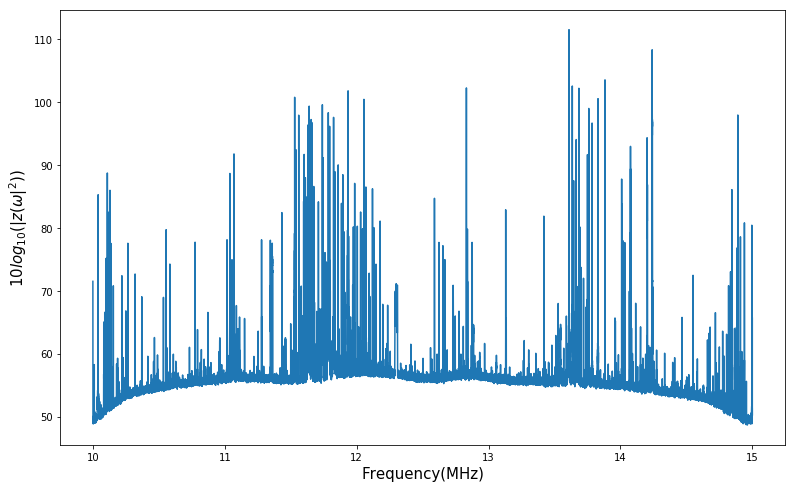

In [11]:
#Plotting
plt.figure(figsize = ((13,8)))
plt.plot(freq,spectrum)
plt.ylabel('$10log_{10}(|z(\omega|^2))$', fontsize = '15')
plt.xlabel('Frequency(MHz)', fontsize = '15')
plt.show()

Here we see the power spectrum of the whole frequencyband of the signal. Here there are frequencies who are potential radio station since they have strong avaraged power. Here we used decibel for the y-axis to easier see the difference between the magnitudes, because otherwise some very strong frequencies would dominate and it would be harder to analyze the signal.

# Task 7.7

In [12]:
# Initializing numpy arrays
freq = np.copy(np.array(freq))
spectrum = np.copy(np.array(spectrum))

# Getting frequency with highest magnitude
largest_magnitude = freq[spectrum.argmax()]
print('Largest magnitude spectral component is at {:.2f} MHz'.format(largest_magnitude))

Largest magnitude spectral component is at 13.61 MHz


# Task 7.8

Largest magnitude spectral component is at 13.61 MHz


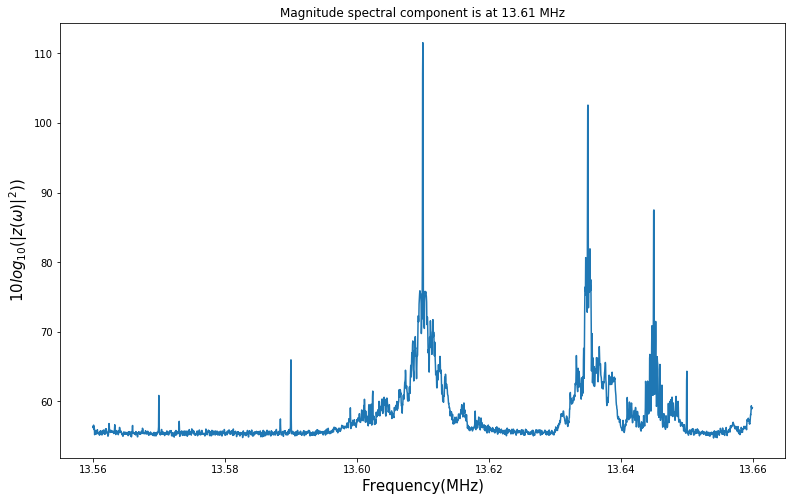

In [13]:
# every jump is 38.16 Hz 
delta_f = 38.16

# difference from center
khz100 = int(50e3)

# Getting lowest and highest value of the local spectra
low = int(spectrum.argmax()-khz100/delta_f)
high = int(spectrum.argmax()+khz100/delta_f)

# Getting frequency with highest magnitude
largest_magnitude = freq[spectrum.argmax()]
print('Largest magnitude spectral component is at {:.2f} MHz'.format(largest_magnitude))

# Plotting 
plt.figure(figsize = ((13,8)))
plt.plot(np.copy(freq[low:high]),np.copy(spectrum[low:high]))
plt.title('Magnitude spectral component is at {:.2f} MHz'.format(largest_magnitude))
plt.ylabel('$10log_{10}(|z(\omega)|^2))$', fontsize = '15')
plt.xlabel('Frequency(MHz)', fontsize = '15')
plt.show()

Here we have the frequencies in the spectrum  ±50kHz±50kHz  from the strongest signal, here we one dominating frequency at around 13.610MHz. Here we can see a big spike in the middle that looks like a dirac delta function.

# Task 7.9

Largest magnitude spectral component is at 13.61 MHz


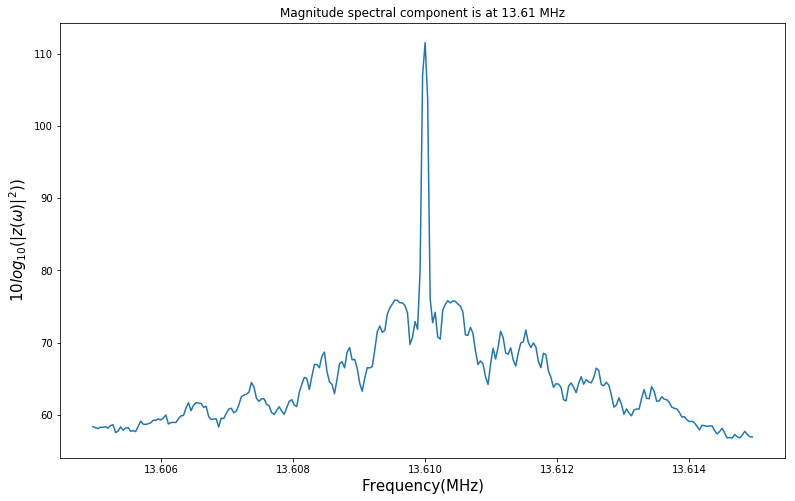

In [43]:
# every jump is 38.16 Hz 
delta_f = 38.16

# difference from center
khz100 = int(5e3)

# Getting lowest and highest value of the local spectra
low = int(spectrum.argmax()-khz100/delta_f)
high = int(spectrum.argmax()+khz100/delta_f)

# Getting frequency with highest magnitude
largest_magnitude = freq[spectrum.argmax()]
print('Largest magnitude spectral component is at {:.2f} MHz'.format(largest_magnitude))

# Plotting 
plt.figure(figsize = ((13,8)))
plt.plot(np.copy(freq[low:high]),np.copy(spectrum[low:high]))
plt.title('Magnitude spectral component is at {:.2f} MHz'.format(largest_magnitude))
plt.ylabel('$10log_{10}(|z(\omega)|^2))$', fontsize = '15')
plt.xlabel('Frequency(MHz)', fontsize = '15')
plt.show()

This is how the spectral component look like in the $\pm 10kHz$ range. We can see here that it looks very symmetric around the max value. It also has a very narrow frequency.

# Task 7.10

Second largest magnitude spectral component is at 14.24 MHz


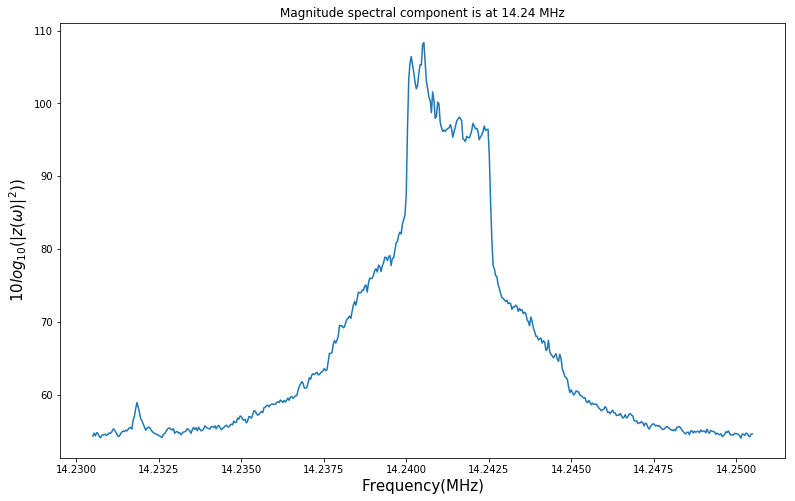

In [44]:

# Observing that the second biggest peak is at higher frequency then the biggest one so i narrow the spectrum down from the highest frequency of the largest magnitude frequency
spectrum_new = np.copy(spectrum)[high:]
freq_new = np.copy(freq)[high:]


largest_magnitude_new = freq_new[spectrum_new.argmax()]
print('Second largest magnitude spectral component is at {:.2f} MHz'.format(largest_magnitude_new))

# every jump is 38.16 Hz 
delta_f = 38.16

# difference from center (10kHz)
diff_second = int(10e3)

# Getting lowest and highest value of the local spectra
low_new = int(spectrum_new.argmax()-diff_second/delta_f)
high_new = int(spectrum_new.argmax()+diff_second/delta_f)

# Plotting 
plt.figure(figsize = ((13,8)))
plt.plot(np.copy(freq_new[low_new:high_new]),np.copy(spectrum_new[low_new:high_new]))
plt.title('Magnitude spectral component is at {:.2f} MHz'.format(largest_magnitude_new))
plt.ylabel('$10log_{10}(|z(\omega)|^2))$', fontsize = '15')
plt.xlabel('Frequency(MHz)', fontsize = '15')
plt.show()


The second largest in magnitude doesnt have the same level of symmetry as the first, but there are some symmetry. This one unlike the others is very broad in frequency.

[ 13.61502544  13.61506359  13.61510174 ...,  14.2304171   14.23045525
  14.2304934 ]
Second largest magnitude spectral component is at 13.88 MHz


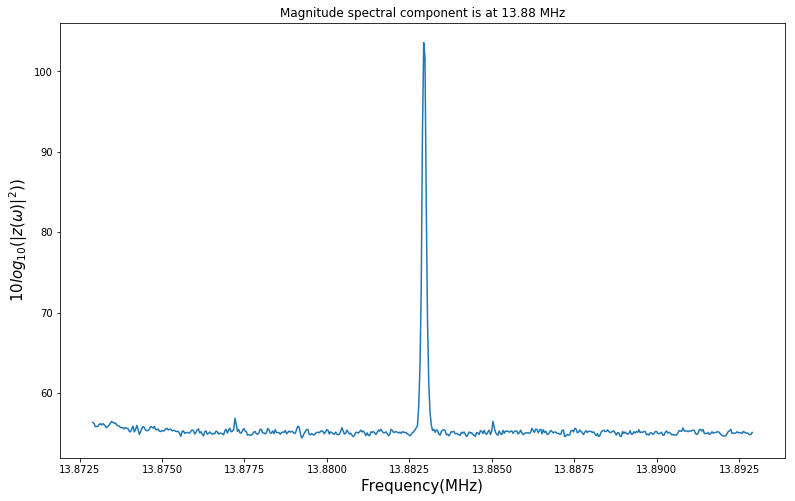

In [16]:
# Observing that the third biggest peak is at lower frequency then the biggest one so i narrow the spectrum down from the highest frequency of the largest magnitude frequency

spectrum_third = np.copy(spectrum)[high:high+low_new]
freq_third = np.copy(freq)[high:high+low_new]

print(freq_third)

largest_magnitude_third = freq_third[spectrum_third.argmax()]
print('Second largest magnitude spectral component is at {:.2f} MHz'.format(largest_magnitude_third))

# every jump is 38.16 Hz 
delta_f = 38.16

# difference from center (10kHz)
diff_third = int(10e3)

# Getting lowest and highest value of the local spectra
low_third = int(spectrum_third.argmax()-diff_third/delta_f)
high_third = int(spectrum_third.argmax()+diff_third/delta_f)


freq_third = freq_third[low_third:high_third]
spectrum_third = spectrum_third[low_third:high_third]


# Plotting 
plt.figure(figsize = ((13,8)))
plt.plot(freq_third,spectrum_third)
plt.title('Magnitude spectral component is at {:.2f} MHz'.format(largest_magnitude_third))
plt.ylabel('$10log_{10}(|z(\omega)|^2))$', fontsize = '15')
plt.xlabel('Frequency(MHz)', fontsize = '15')
plt.show()


This third largest is also symmetric and is also very narrow in frequency

# Task 8

# Task 8.1

In [14]:
# Importing signal
h=h5py.File("hf_12.5_5MHz.h5","r")
z=np.copy(h["z"].value)
h.close()

# Set N
N = 131072
# Overlap
step = int(N/2)
# Length of signal
length = len(z)

# steps
n_steps = int(length/step)

# Using Hann window
tapering_window = signal.hann(N)

# Initialize matrix to contain N spectral components
# as a function of time (n_steps)
S = np.zeros([n_steps-1,N], dtype= np.float32)
# # Go through all time steps

for i in range(n_steps):
    
    zin = z[i*step:(i*step+N)]
    if len(zin) == N:
        # Filling up rows(time) with the signals magnitude over the window
        S[i,:] = np.abs(np.fft.fftshift(np.fft.fft(tapering_window*zin)))**2.0
        


Here we "Scan" the signal with the hann window and fill up our matrix with the magnitudes of the signal.

# Task 8.2

In [15]:
print('N/2 represents {:.3f} seconds'.format(step/(5*1e6)))

N/2 represents 0.013 seconds


Take samplings within N/2 and divide by the sampling frequency which is 5MHz

# Task 8.3

In [16]:
# Making time vector from 0 to 10 with len(S) -> 762 points /long
tvec = np.linspace(0,10,len(S))

# Task 8.4

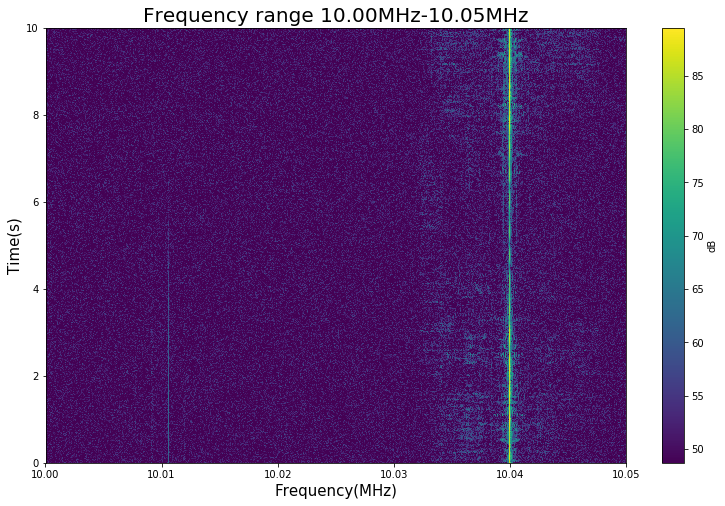

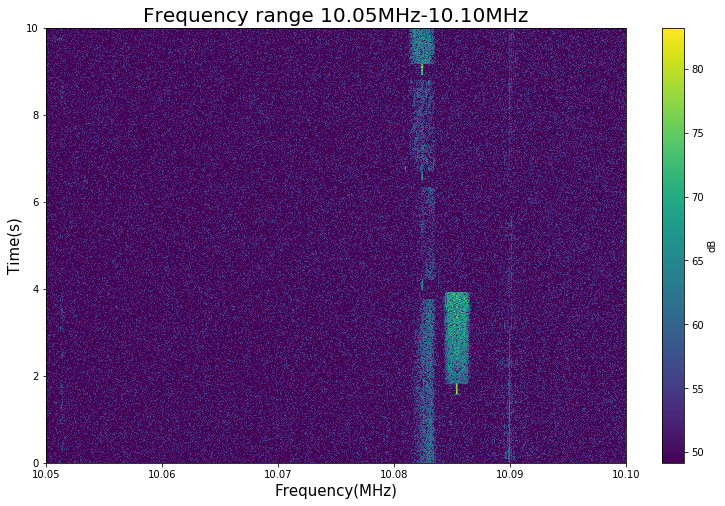

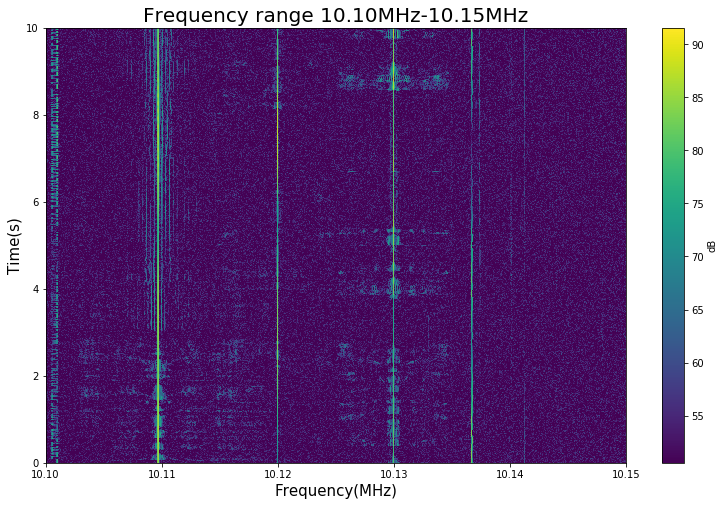

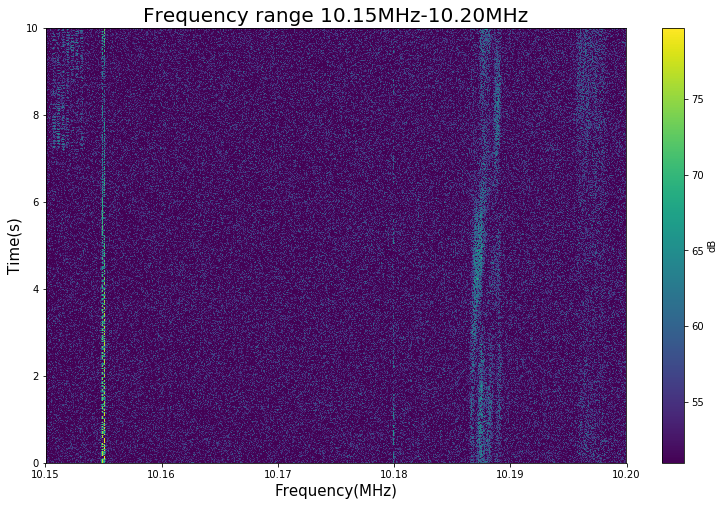

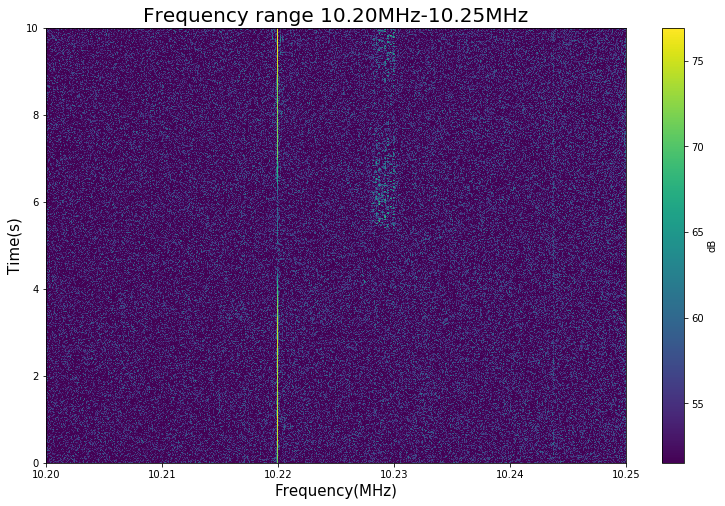

...

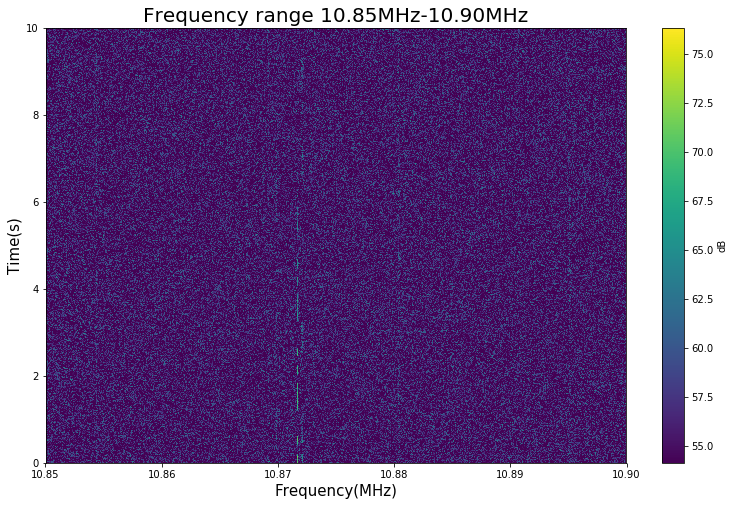

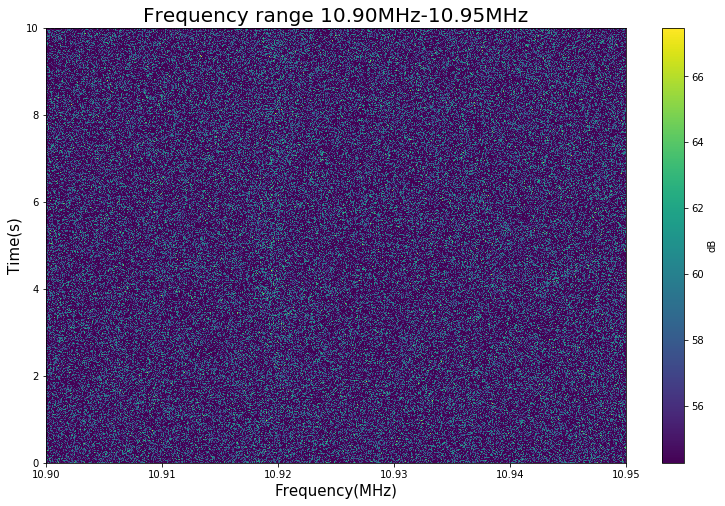

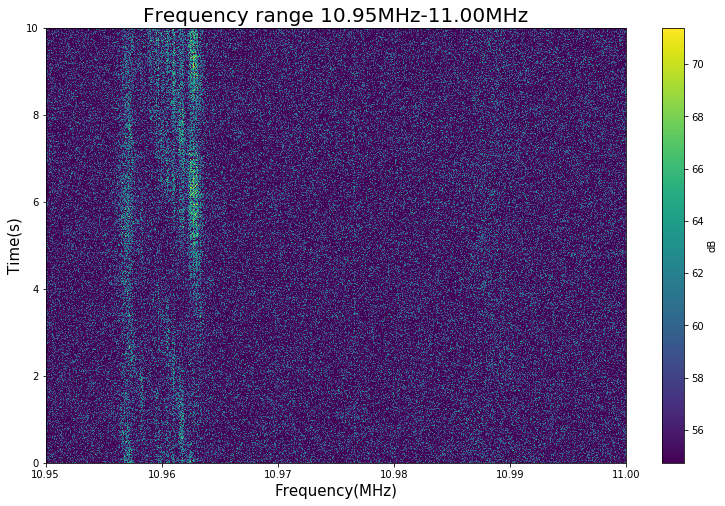

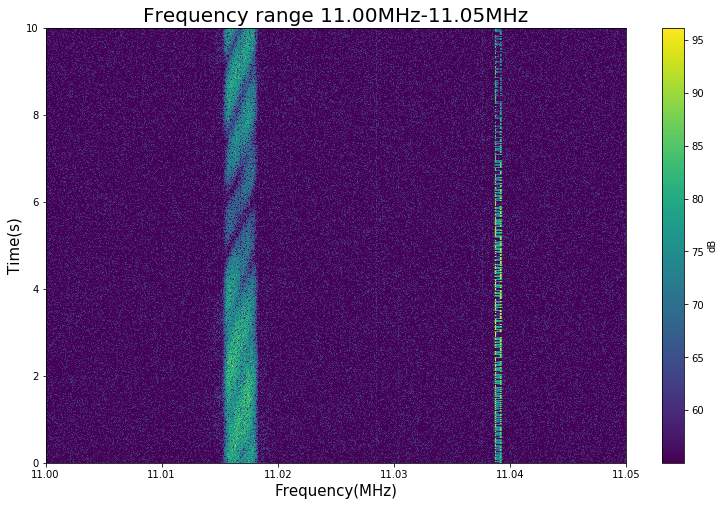

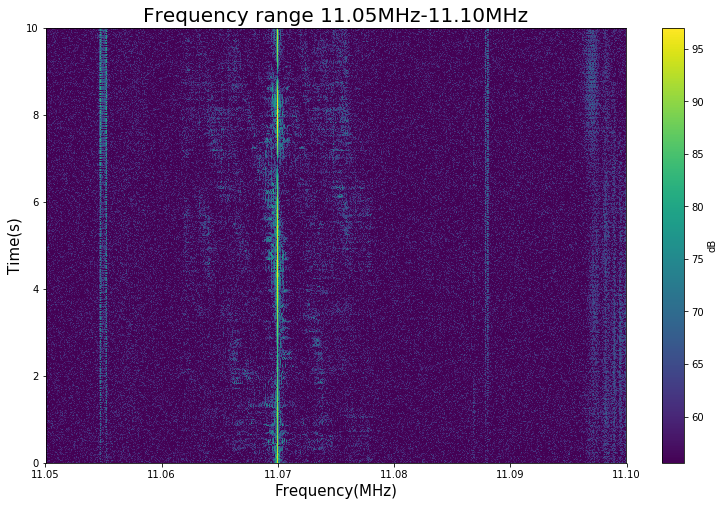

KeyboardInterrupt: 

In [17]:
increment = int(50e3)/1e6
f0 = int(10e6)/1e6
f1 = f0 + increment

#/int(1e6)

# Using the frequency from Task 7.5
fvec = freq


for i in range(100):
    freq_idx = np.where((fvec > f0 )&(fvec < f1))[0]
    
    # Db scale
    dB = 10.0*np.log10(S[:,freq_idx])
    plt.figure(figsize = ((13,8)))
    # Use the median noise floor as the lowest color to make it easier to distinguish the differents signals
    plt.pcolormesh(fvec[freq_idx],tvec,dB,vmin = np.nanmedian(dB))
    plt.title('Frequency range %.2fMHz-%.2fMHz'%(f0,f1),fontsize = '20')
    plt.ylabel('Time(s)',fontsize = '15')
    plt.xlabel('Frequency(MHz)',fontsize = '15')
    zcol = plt.colorbar()
    zcol.set_label('dB')
    plt.savefig('spectrum/spectrum-{}'.format(i+1),dpi = 300)
    # Increasing the frequency band for each iteration
    f0 += increment
    f1 += increment
    # Uncomment this to show plots
    plt.show()
    plt.close()


# Task 8.5

 FIRST PLOT HERE, here we see the spectrogram plot in the range 10.0MHz - 10.05MHz. Here we can observe that we have a signal at strong 10.04MHz and we can observe that it has around 20kHz bandwidth.

# Task 9

# Task 9.1

The spectrum is symmetric since we since the original is real. THIS SHOULD BE REWRITTEN

# Task 9.2

I selected the frequency 10.04Mhz

# Task 9.3

In [ ]:
from scipy.signal import hann

def hann_window(length,cutoff):
    """
    Creates the the ideal*window filter
    
    Param 1: length of filter
    Param 2: Cutoff frequency
    
    Returns samples,filter h (time domain)
   
    """

    # ideal filter
    samp = length
    # sampling rate
    fs = int(5e6)
    # Cutoff frequency
    f_cut = cutoff
    # sample range
    n = np.arange(-samp/2,samp/2)
    # # Filter cutoff frequency
    hatw0 = 2*np.pi*f_cut/fs
    # Make finite impulse filter

    h = hatw0/np.pi*np.sinc(hatw0*n/np.pi)

    # Window
    wl = length
    W = hann(wl)

    # ideal with window
    h = W*h
    return n,h


n,h = hann_window(100000,int(5e3))

# Task 9.4

In [ ]:
# Impulse response
plt.figure(figsize = ((13,8)))
plt.ylabel('$h_{LP}[n]$ (Frequency response)', fontsize = '15')
plt.xlabel('n(Time domain)',fontsize = '15')

len1 = len(n)
print(len1)

plt.plot(n[48000:52000],h[48000:52000],'-')
plt.show()

# Task 9.5

In [ ]:
fvec = np.fft.fftshift(np.fft.fftfreq(len(h), d = 1/5e6))


f0 = -2.5e6
f1 = 2.5e6

fvec_2c5M = np.where((fvec >= f0)& (fvec <= f1))[0]



mag_resp = np.abs(np.fft.fftshift(np.fft.fft(h)))

plt.figure(figsize = ((13,8)))
plt.plot(fvec[fvec_2c5M]/1e6,mag_resp)
plt.title('Lowpass 5kHz filter', fontsize = '30')
plt.ylabel('$h_{LP}[n]$ (Magnitude response)', fontsize = '15')
plt.xlabel('Frequency(MHz)', fontsize = '15')
plt.show()


# Task 9.6

In [ ]:

fvec = np.fft.fftshift(np.fft.fftfreq(len(h), d = 1/5e6))
mag_resp = np.abs(np.fft.fftshift(np.fft.fft(h)))
f0 = -50e3
f1 = 50e3


fvec_50k = np.where((fvec >= f0)& (fvec <= f1))[0]


plt.figure(figsize = ((13,8)))
plt.plot(fvec[fvec_50k]/1e3,mag_resp[fvec_50k])
plt.title('Lowpass 5kHz filter', fontsize = '30')
plt.ylabel('$h_{LP}[n]$ (Magnitude response)', fontsize = '15')
plt.xlabel('Frequency(kHz)', fontsize = '15')
plt.xticks([-50,-40,-30,-20,-10,-5,0,5,10,20,30,40,50])
plt.show()



In [ ]:

# Change filter to be sharper around 5kHz
n,h1 = hann_window(4000,int(3e3))


# Make frequency domain filter
H = np.fft.fft(h1,n = 4000)


# Task 9.7

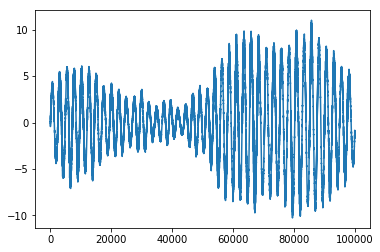

In [26]:
h=h5py.File("hf_12.5_5MHz.h5","r")
z=np.copy(h["z"].value)
h.close()

def get_signal(radio_freqency):
    f0 = int(radio_freqency)
    # Sampling rate
    sr = int(5e6)
    # Decimation by 500 to go from 5MHz to 10kHz
    dec = 500
    # center frequency
    cf = 12.5e6
    low_pass_filter = h1
    # length of the filter
    filter_length = len(low_pass_filter)
    # Number of time steps at 10 kHz
    n_steps = int(((len(z)-filter_length))/dec)
    # time vector
    t = np.arange(filter_length, dtype = np.float)/sr
    # frequency shift to DC, radio station at frequency f0
    df = f0-cf
    # complex exponential with negative frequency
    csin = np.exp(-1j*2.0*np.pi*t*df)
    z_10kHz =np.zeros(n_steps,dtype = np.complex64)
    # phase variable to store the current phase of the complex exponential signal
    phase0 = 0.0

    for i in range(n_steps):
        # initial phase of the sinusoid
        phase = np.exp(1j*phase0)
        z_10kHz[i] = np.sum(low_pass_filter*z[(i*dec):(i*dec + filter_length)]*csin*phase)
        # the store the initial phase of the exponential signal for the next step
        phase0 = np.fmod(phase0-2.0*np.pi*(dec*df/sr),2.0*np.pi)
    return z_10kHz


z_10kHz = get_signal(13.61e6)

plt.plot(z_10kHz.real)
plt.show()






# Task 9.8

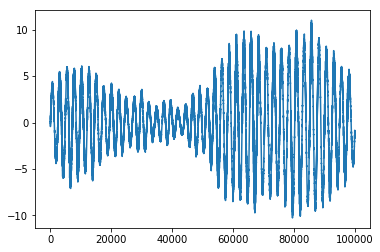

C:\Users\foxxravin\Anaconda3\lib\site-packages\numpy\core\numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


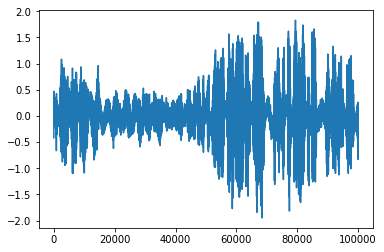

In [27]:
plt.plot(z_10kHz.real)
plt.show()

# FFT
Z = np.copy(np.fft.fft(z_10kHz))
# filter out negative frequencies
Z[int(len(Z)/2):len(Z)]=0.0
# Inverse
z_10kHz = np.fft.ifft(Z)
plt.plot(z_10kHz)
plt.show()

# Task 9.9

C:\Users\foxxravin\Anaconda3\lib\site-packages\numpy\core\numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


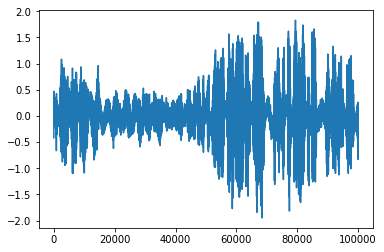

In [28]:

# FFT
Z = np.fft.fft(z_10kHz)

fre = np.fft.fftfreq(len(Z),d = 1/5e6)


# freqz = np.fft.fftfreq(len(Z))
# freqz = np.fft.fftshift(freqz)

ind = np.where(fre < 50)[0]
Z[ind] = 0

z_10kHz = np.fft.ifft(Z)

audio = np.real(z_10kHz)

plt.plot(z_10kHz)
plt.show()

# Task 9.10

In [29]:
audio = np.real(z_10kHz)

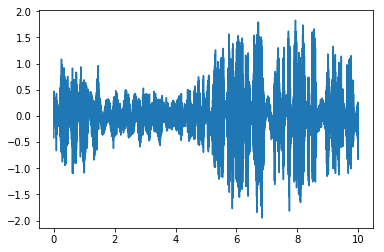

In [30]:
time_vec = np.linspace(0,10,len(audio))
plt.plot(time_vec,audio)
plt.show()

audio = audio/np.max(np.abs(audio))
write('TEST1111111.wav',int(10e3),audio)

# Task 9.11

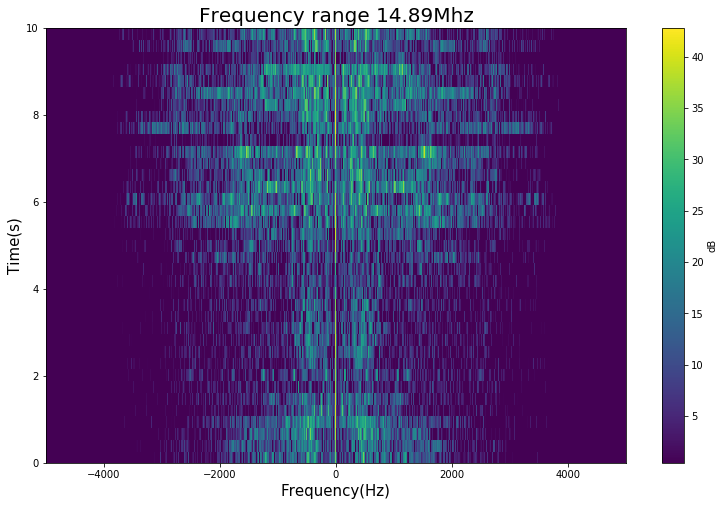

38
5000


In [31]:

# Set N
N = 5000
# Overlap
step = int(N/2)
# Length of signal
length = len(audio)

# steps
n_steps = int(length/step)


# Using Hann window
tapering_window = signal.hann(N)

# Initialize matrix to contain N spectral components
# as a function of time (n_steps)
S = np.zeros([n_steps-1,N], dtype= np.float32)
# # Go through all time steps

for i in range(n_steps-1):

    zin = audio[i*step:(i*step+N)]
        # Filling up rows(time) with the signals magnitude over the window
    S[i,:] = np.abs(np.fft.fftshift(np.fft.fft(tapering_window*zin)))**2.0

    
# Initialize time vector
tvec = np.linspace(0,10,len(S))
# Initialize frequency vector transpoe to get column dimension length
fvec = np.linspace(-5000,5000,len(S.T))

# Db scale
dB = 10.0*np.log10(S)
plt.figure(figsize = ((13,8)))
# Use the median noise floor as the lowest color to make it easier to distinguish the differents signals
plt.pcolormesh(fvec,tvec,dB,vmin = np.nanmedian(dB))
plt.title('Frequency range 14.89Mhz',fontsize = '20')
plt.ylabel('Time(s)',fontsize = '15')
plt.xlabel('Frequency(Hz)',fontsize = '15')
zcol = plt.colorbar()
zcol.set_label('dB')
plt.show()
plt.close()

print(len(S))
print(len(S.T))

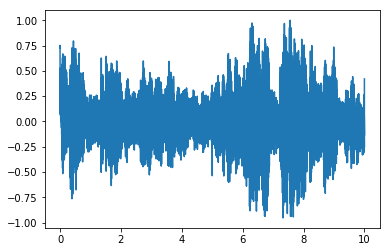

In [32]:
def get_sound(z_10kHz,radio_freqency):
    
    z_10kHz = get_signal(radio_freqency)
    
    # FFT
    Z = np.copy(np.fft.fft(z_10kHz))
    # filter out negative frequencies
    Z[int(len(Z)/2):len(Z)]=0.0
    # Inverse
    z_10kHz = np.fft.ifft(Z)

    # FFT
    Z = np.fft.fft(z_10kHz)
    ind = np.where((Z < 50) & (Z > -50))[0]

    Z[ind] = 0

    z_10kHz = np.fft.ifft(Z)

    audio = np.real(z_10kHz)
    
    audio = np.real(z_10kHz)

    audio = audio/np.max(np.abs(audio))
    
    time_vec = np.linspace(0,10,len(audio))

    plt.plot(time_vec,audio)
    plt.show()

    write('%s.wav'%radio_freqency,int(10e3),audio)


lst = [14.89e6]

for i in lst:
    
    get_sound(z_10kHz,i)

# TASK 10

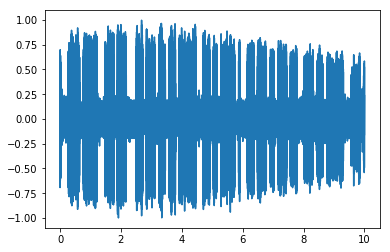

In [33]:
# Morsecode
get_sound(z_10kHz,14.01e6)

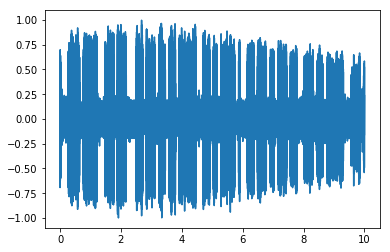

In [34]:

get_sound(z_10kHz,14.01e6)

In [35]:
import matplotlib.pyplot as plt 
import numpy as np
from scipy.io.wavfile import write

class radio_station():
    """
    
    Summary: 
    
        Object is the processes signal for a radio frequency.
        
    Parameters:
    
        Param1:(list) The signal
        Param2:(int) The radio station frequency
        Param3:(str) 'Optional' Label the station
        
    Functions:
    
        object.writefile():
            Writes out the soundfile
            
        object.spectrogram():
            Plots spectromgram with matplotlib in the frequency -5000 to 5000 Hz
            and 0 to 10 seconds.     
    
    """
    
    
    def __init__(self,signal,radio_frequency,h1, label = ''):
        
        #Initializing object values
        z = signal
        self.radio_frequency = int(radio_frequency)
        self.label = label
        self.h = h1
        
        # Radio station frequency
        f0 = int(self.radio_frequency)
        # Sampling rate
        sr = int(5e6)
        # Decimation by 500 to go from 5MHz to 10kHz
        dec = 500
        # center frequency
        cf = 12.5e6
        low_pass_filter = self.h
        # length of the filter
        filter_length = len(low_pass_filter)
        # Number of time steps at 10 kHz
        n_steps = int(((len(z)-filter_length))/dec)
        # time vector
        t = np.arange(filter_length, dtype = np.float)/sr
        # frequency shift to DC, radio station at frequency f0
        df = f0-cf
        # complex exponential with negative frequency
        csin = np.exp(-1j*2.0*np.pi*t*df)
        z_10kHz =np.zeros(n_steps,dtype = np.complex64)
        # phase variable to store the current phase of the complex exponential signal
        phase0 = 0.0

        for i in range(n_steps):
            # initial phase of the sinusoid
            phase = np.exp(1j*phase0)
            z_10kHz[i] = np.sum(low_pass_filter*z[(i*dec):(i*dec + filter_length)]*csin*phase)
            # the store the initial phase of the exponential signal for the next step
            phase0 = np.fmod(phase0-2.0*np.pi*(dec*df/sr),2.0*np.pi)
        
        
        # Clean up signal
        # FFT
        Z = np.copy(np.fft.fft(z_10kHz))
        # filter out negative frequencies
        Z[int(len(Z)/2):len(Z)] = 0.0
        
        # Remove low frequency carrier signa, sampling freq 10kHz
        fre = np.fft.fftfreq(len(Z),d = 1/10e3)
        # Get index of values where frequency is below 50
        ind = np.where(fre < 50)[0]
        # Set values in the spectral component to zero.
        Z[ind] = 0.0
        
        
        # Inverse FFT back to time domain
        z_10kHz = np.fft.ifft(Z)
        # Assign processed signal to self property
        self.z_10kHz = z_10kHz
        
    
    def writefile(self):
        # Take real values of the signal
        audio = np.real(self.z_10kHz)
        # Scale to unity
        audio = audio/np.max(np.abs(audio))
        # Write soundfile
        write('%s.wav'%self.radio_frequency,int(10e3),audio)
        print('File {}.wav has been written'.format(str(self.radio_frequency)))
 
    
              
    def spectrogram(self,N = 1000):
        """
        Summary:
            Plots the dynamic spectrum
            
        Parameters:
            Param1: (int) N is the fft length
        """
        # Get real values of signal
        audio = np.real(self.z_10kHz)
        # Overlap
        step = int(N/2)
        # Length of signal
        length = len(audio)

        # steps
        n_steps = int(length/step)


        # Using Hann window
        tapering_window = signal.hann(N)

        # Initialize matrix to contain N spectral components
        # as a function of time (n_steps)
        S = np.zeros([n_steps-1,N], dtype= np.float32)
        # # Go through all time steps
        for i in range(n_steps-1):

            zin = audio[i*step:(i*step+N)]
                # Filling up rows(time) with the signals magnitude over the window
            S[i,:] = np.abs(np.fft.fftshift(np.fft.fft(tapering_window*zin)))**2.0


        # Initialize time vector
        tvec = np.linspace(0,10,len(S))
        # Initialize frequency vector transpoe to get column dimension length
        fvec = np.linspace(-5000,5000,len(S.T))
        
        # Db scale
        dB = 10.0*np.log10(S)
        plt.figure(figsize = ((13,8)))
        # Use the median noise floor as the lowest color to make it easier to distinguish the differents signals
        # Plotting
        plt.pcolormesh(fvec,tvec,dB,vmin = np.nanmedian(dB))
        plt.title('Frequency range %sMhz'%(self.radio_frequency/1e6),fontsize = '20')
        plt.ylabel('Time(s)',fontsize = '15')
        plt.xlabel('Frequency(Hz)',fontsize = '15')
        zcol = plt.colorbar()
        zcol.set_label('dB')
        plt.show()
        plt.close()

              

        

In [36]:
# Change filter to cutoff frequency at 3000 to be sharper around 5kHz
n,h1 = hann_window(4000,int(3e3))
signal1 = radio_station(z,11.53e6,h1,'turkish dance channel?')
signal2 = radio_station(z,11.66e6,h1, 'Canadian? talking about prince harry')
signal3 = radio_station(z,13.61e6,h1 , 'Arabic')
signal4 = radio_station(z,11.935e6,h1, 'Islamic call to prayer?')
signal5 = radio_station(z,14.24e6,h1, 'Russian? speaking some english')
signal6 = radio_station(z,14.89e6,h1, 'task11 frequency')

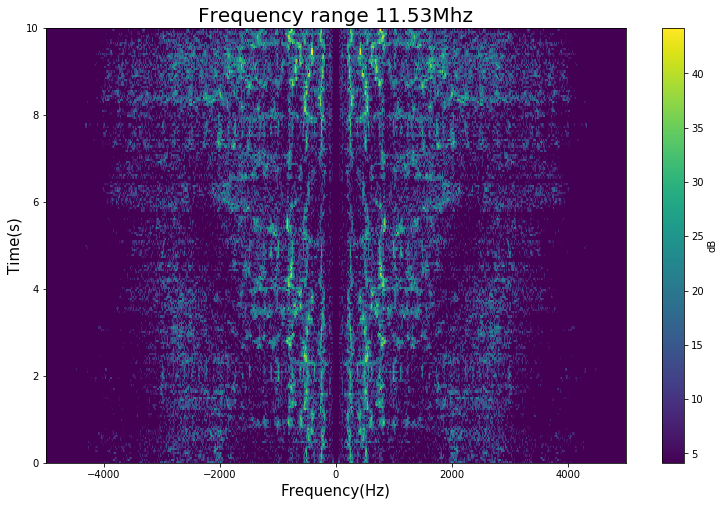

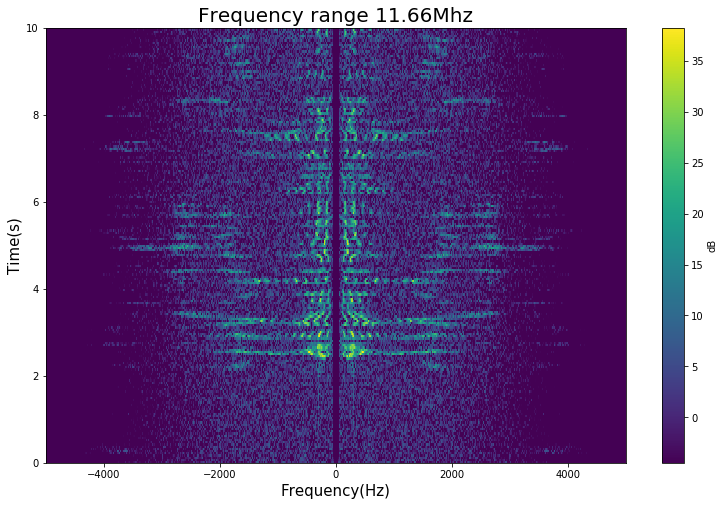

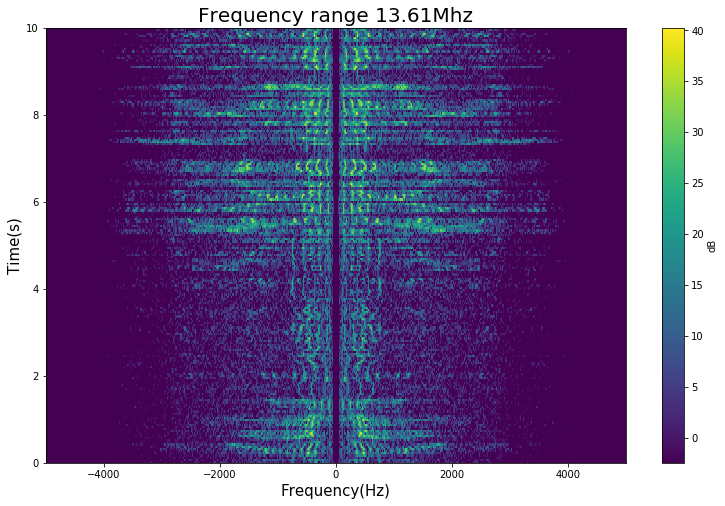

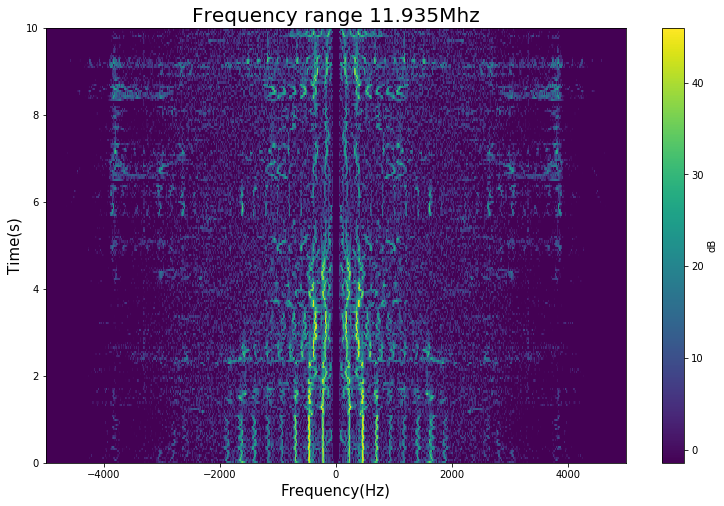

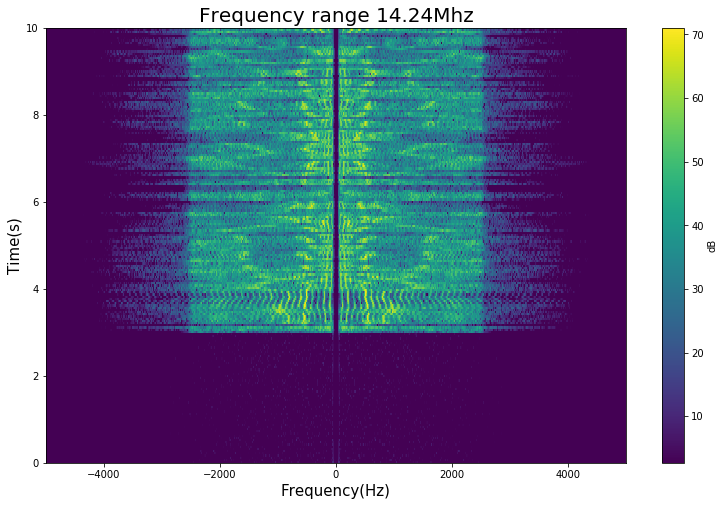

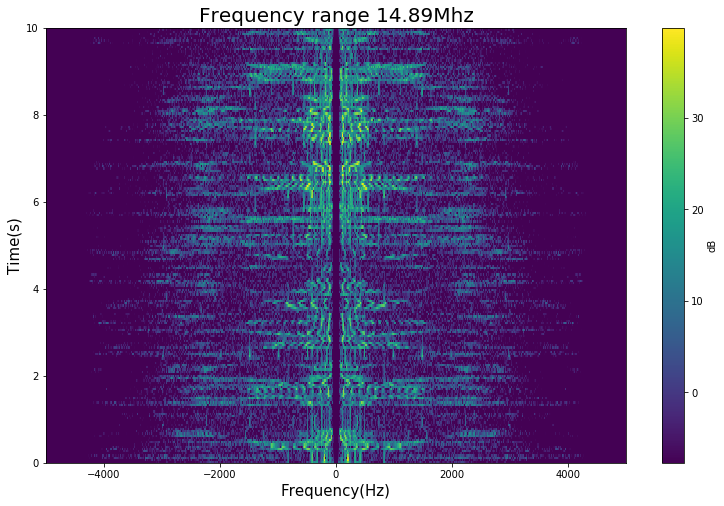

In [37]:
signal1.spectrogram()
signal2.spectrogram()
signal3.spectrogram()
signal4.spectrogram()
signal5.spectrogram()
signal6.spectrogram()

In [38]:
signal1.writefile()
signal6.writefile()

File 11530000.wav has been written
File 14890000.wav has been written


In [39]:
# Change filter to be sharper around 5kHz
n,h1 = hann_window(4000,int(5e3))

In [50]:
morse = radio_station(z,14.032e6,h1)

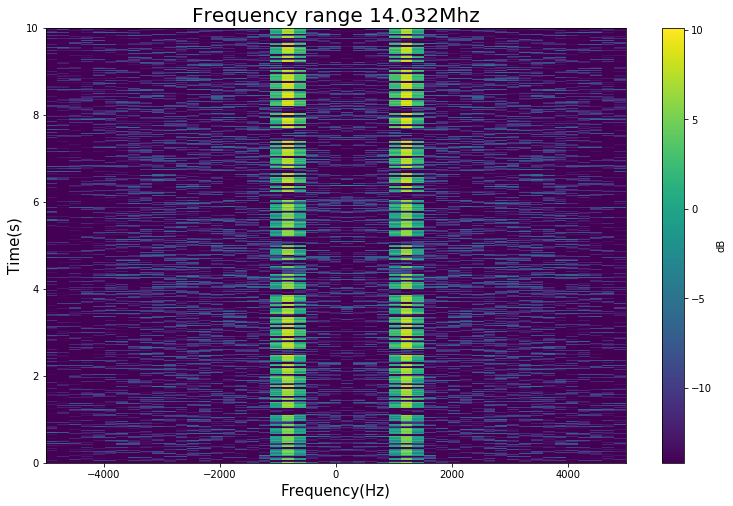

In [61]:
morse.spectrogram(50)

In [42]:
morse.writefile()

File 14032000.wav has been written


In [43]:
task103 = radio_station(z,11.66e6,h1)
task103.writefile()

File 11660000.wav has been written
